In [2]:
import copy
import csv
import cvxpy
import datetime
import json
import math
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.pyplot as plt
import multiprocessing
from multiprocessing import Pool
import numpy as np
import os
import pandas as pd
import pickle
import random
import seaborn as sns
from typing import List, Dict
import sys
import warnings
warnings.filterwarnings("ignore", category=FutureWarning) 
sys.path.append('../../')

from skyburst import Job
from skyburst.plot import *
from skyburst.traces import philly
from skyburst.traces import philly_utils

# NUM_GPUS per node: 8
GPUS_PER_NODE = 8

def load_logs(file_path: str):
    file = open(file_path)
    return pickle.load(file)

In [2]:
def create_results_df(simulator_results: dict):
    results_df = pd.DataFrame({'alg': pd.Series(dtype='str'),
                   'size': pd.Series(dtype='int'),
                   'cost': pd.Series(dtype='float'),
                   'waiting_time': pd.Series(dtype='float')})
    algs = []
    num_nodes_list = []
    cloud_costs = []
    waiting_times = []
    for key, finished_jobs in simulator_results.items():
        token_list = key.split('-')
        if len(token_list)>0:
            alg =  '-'.join(token_list[:-1])
            num_nodes = token_list[-1]
        else:
            alg = f'{token_list[0]}-{token_list[1]}'
            num_nodes = token_list[2]
        num_nodes = int(num_nodes)
        cloud_cost = 0.0
        total_waiting_time = 0.0
        count = 0
        for idx in range(len(finished_jobs['idx'])):
            if idx < 2000 or idx > len(finished_jobs['idx']) - 2000:
                continue
            arrival = finished_jobs['arrival'][idx]
            start = finished_jobs['start'][idx]
            # Handle legacy data
            if finished_jobs['state'][idx] != 'LOCAL':
                runtime = finished_jobs['runtime'][idx]
                cloud_cost += finished_jobs['num_gpus'][idx] * runtime
                if finished_jobs['state'][idx] == 'FILTER-CLOUD':
                    total_waiting_time += start - arrival
                else:
                    deadline = finished_jobs['deadline'][idx]
                    total_waiting_time += deadline - runtime - arrival
            else:
                total_waiting_time += start - arrival
            count+=1
        avg_waiting_time = total_waiting_time / count
        df = pd.DataFrame(data={'alg': [alg], 'size': [num_nodes], 'cost': [cloud_cost], 'waiting_time': [avg_waiting_time]})
        results_df = pd.concat([results_df, df], ignore_index=True)
#         algs.append(alg)
#         num_nodes_list.append(num_nodes)
#         cloud_costs.append(cloud_cost)
#         waiting_times.append(avg_waiting_time)
#     new_row = {'alg': algs, 'size': num_nodes_list, 'cost': cloud_costs, 'waiting_time': waiting_times}
#     results_df = pd.DataFrame(data=new_row)
    return results_df

def plot_cost_and_waiting_graph(results_df, normalized=False, plot_twin=True):
#     options = ['fifo', 'lifo', 'lifo-nohol']
#     results_df = results_df[results_df['alg'].isin(options)]
    if plot_twin:
        fig, ax = plt.subplots()
        ax2 = ax.twinx()
    else:
        # Get current default figsize
        default_figsize = plt.rcParams.get('figure.figsize')
        # Set the new figsize as the default
        fix, (ax, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(2*default_figsize[0], 2*default_figsize[1]))
        
    if normalized:
        x_axis = 'norm_size'
        label_x = 'Input rate/ Cluster capacity'
        total_job_gpu_hours = 1155998.77277777
        job_makespan = 2559.3205555555555
        results_df[x_axis] = total_job_gpu_hours/(job_makespan*results_df['size']*8)
    else:
        x_axis = 'size'
        label_x = '# of Cluster Node(s)'
    
    for idx, (label, grp) in enumerate(results_df.groupby('alg')):
        a1 = grp.plot(x = x_axis, y = 'cost',ax = ax, marker='^', label = label, legend=None, xlabel=label_x, \
                ylabel='Cloud Price')
        if plot_twin:
            style = '--'
        else:
            style = None
        a2 = grp.plot(x = x_axis, y = 'waiting_time', ax = ax2, marker='v', label = label, legend=None, xlabel=label_x, \
                      ylabel = 'Avg. Waiting Time', style=style)
    ax.set_ylim(bottom=0.0)
    
    if plot_twin:
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines + lines2, labels + labels2, ncol=len(labels) + len(labels2), \
                  bbox_to_anchor=(0, 1.00, 1, 0.2), loc="upper left")
        ax.grid(True, which='both')
    else:
        lines, labels = ax.get_legend_handles_labels()
        ax.legend(lines, labels, ncol=len(labels), \
                  bbox_to_anchor=(0, 0.90, 1, 0.2), loc="upper left")
        ax.grid(True, which='both')
        ax2.grid(True, which='both')
    plt.show()  

In [3]:
deadlines = [1, 1.25, 100000]
hybrid_results={}
hybrid_results_df = pd.DataFrame()
for ddl in deadlines:
    print(ddl)
    file = open(f'logs/base/vjw_philly_{ddl}_cont.log', 'rb')
    hybrid_results[ddl] = pickle.load(file)
    temp_df = create_results_df(hybrid_results[ddl])
    temp_df["deadline"] = ddl
    if ddl == 1:
        temp_df['waiting_time'] = 0
    plot_cost_and_waiting_graph(temp_df, normalized=False, plot_twin=False)
    hybrid_results_df = pd.concat([hybrid_results_df, temp_df], ignore_index=True)

1


KeyboardInterrupt: 

1.25


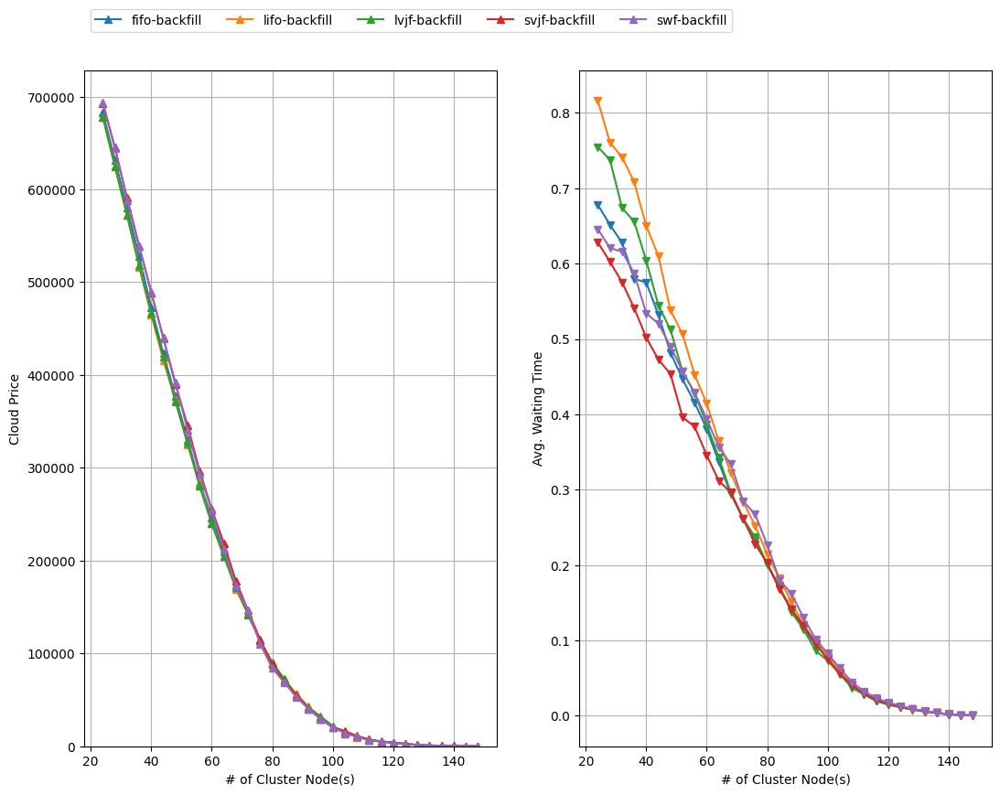

In [4]:
deadlines = [1.25]
for ddl in deadlines:
    print(ddl)
    file = open(f'logs/backfill-new/vjw_philly_{ddl}_cont.log', 'rb')
    temp = pickle.load(file)
    hybrid_results[f'{ddl}-backfill'] = temp
    temp_df = create_results_df(temp)
    temp_df["deadline"] = ddl
    if ddl == 1:
        temp_df['waiting_time'] = 0
    hybrid_results_df = pd.concat([hybrid_results_df, temp_df], ignore_index=True)
    temp_df = hybrid_results_df[hybrid_results_df['alg'].str.contains("backfill")]
    temp_df = temp_df[temp_df['deadline']==ddl]
    plot_cost_and_waiting_graph(temp_df, normalized=False, plot_twin=False)

1.25


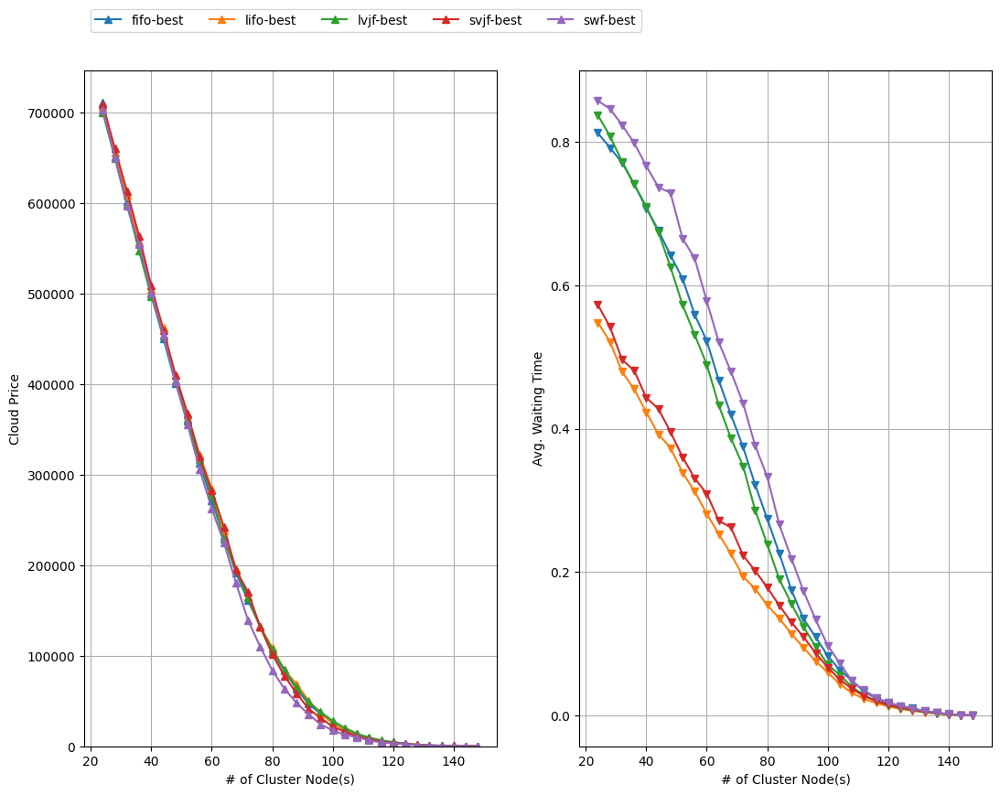

In [5]:
deadlines = [1.25]
for ddl in deadlines:
    print(ddl)
    file = open(f'logs/best/vjw_philly_{ddl}_cont.log', 'rb')
    temp = pickle.load(file)
    hybrid_results[f'{ddl}-best'] = temp
    temp_df = create_results_df(temp)
    temp_df["deadline"] = ddl
    if ddl == 1:
        temp_df['waiting_time'] = 0
    hybrid_results_df = pd.concat([hybrid_results_df, temp_df], ignore_index=True)
    temp_df = hybrid_results_df[hybrid_results_df['alg'].str.contains("best")]
    temp_df = temp_df[temp_df['deadline']==ddl]
    plot_cost_and_waiting_graph(temp_df, normalized=False, plot_twin=False)

1.25


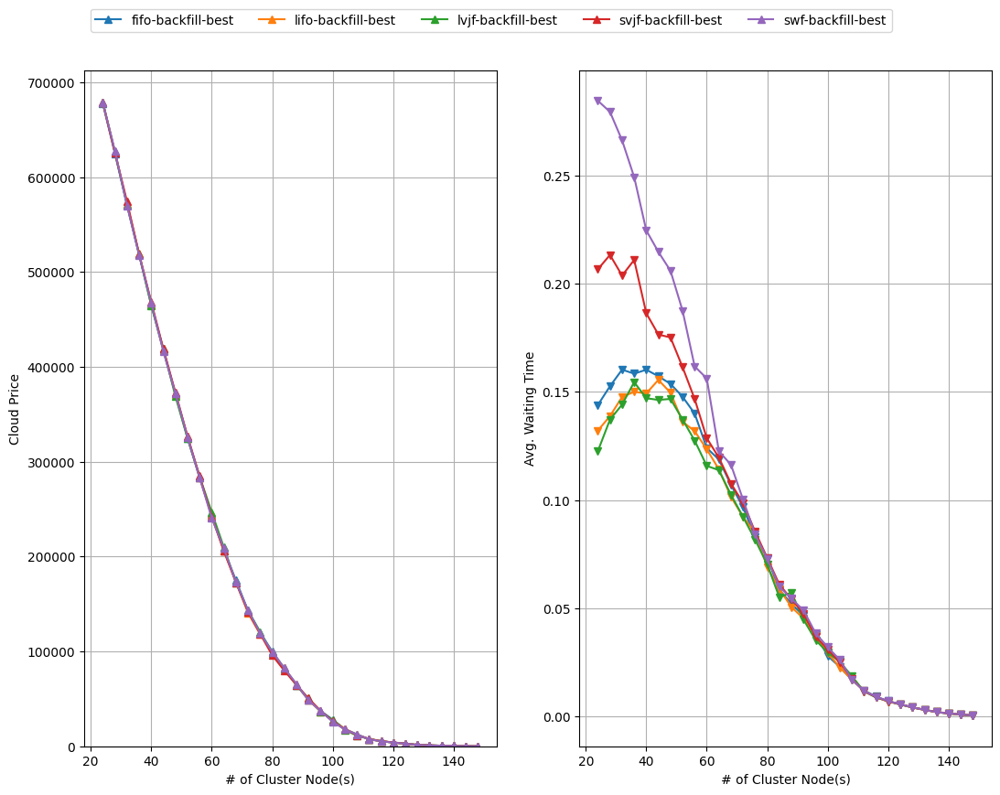

In [6]:
deadlines = [1.25]
for ddl in deadlines:
    print(ddl)
    file = open(f'logs/backfill-best/vjw_philly_{ddl}_cont.log', 'rb')
    temp = pickle.load(file)
    hybrid_results[f'{ddl}-backfill-best'] = temp
    temp_df = create_results_df(temp)
    temp_df["deadline"] = ddl
    if ddl == 1:
        temp_df['waiting_time'] = 0
    hybrid_results_df = pd.concat([hybrid_results_df, temp_df], ignore_index=True)
    temp_df = hybrid_results_df[hybrid_results_df['alg'].str.contains("backfill-best")]
    temp_df = temp_df[temp_df['deadline']==ddl]
    plot_cost_and_waiting_graph(temp_df, normalized=False, plot_twin=False)

1.25
['fifo-backfill', 'swf-backfill', 'lvjf-backfill', 'svjf-backfill', 'lifo-backfill', 'edf-backfill', 'ldf-backfill', 'sjf-backfill', 'ljf-backfill']
                alg  size           cost  waiting_time  deadline
960   fifo-backfill    24  751211.599722      0.139434      1.25
961   lifo-backfill    24  751981.833611      0.128479      1.25
962    sjf-backfill    24  751191.286389      0.238866      1.25
963   svjf-backfill    24  753417.153333      0.200813      1.25
964    ljf-backfill    24  751007.458611      0.123295      1.25
...             ...   ...            ...           ...       ...
1274   ljf-backfill   148      20.640833      0.000356      1.25
1275  lvjf-backfill   148      20.640833      0.000356      1.25
1276   edf-backfill   148      15.688333      0.000386      1.25
1277   ldf-backfill   148      20.992778      0.000355      1.25
1278   swf-backfill   148      13.356389      0.000391      1.25

[288 rows x 5 columns]


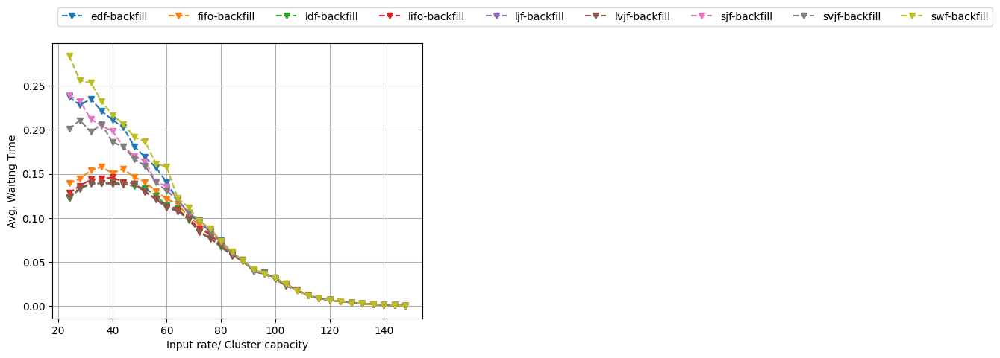

In [33]:

def plot_waiting_graph(results_df, ddl, normalized=False, title=None):
    fig, ax = plt.subplots()
    options = ['fifo', 'swf', 'lvjf', 'svjf', 'lifo', 'edf', 'ldf', 'sjf', 'ljf']
    options = options + [o + '-backfill' for o in options]
    options = [o for o in options if 'backfill' in o]
    #options.remove('fifo-nohol')
    print(options)
    results_df = results_df[results_df['alg'].isin(options)]
    
    results_df = results_df[results_df['deadline']==ddl]
    
    if normalized:
        x_axis = 'norm_size'
        label_x = 'Input rate/ Cluster capacity'
        total_job_gpu_hours = 1155998.77277777
        job_makespan = 2559.3205555555555
        results_df[x_axis] = total_job_gpu_hours/(job_makespan*results_df['size']*8)
    else:
        x_axis = 'size'
        label_x = '# of Cluster Node(s)'
    
    for idx, (label, grp) in enumerate(results_df.groupby('alg')):
        grp.plot(x = x_axis, y = 'waiting_time', ax = ax, marker='v', label = label, legend=None, xlabel = 'Input rate/ Cluster capacity', \
                      ylabel = 'Avg. Waiting Time', style='--')
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, ncol=len(labels), \
              bbox_to_anchor=(0, 0.95, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()
    
deadlines = [1, 1.1, 1.25, 1.5, 2]
deadlines = [1.25]
for ddl in deadlines:
    print(ddl)
    plot_waiting_graph(hybrid_results_df, ddl, normalized=False)

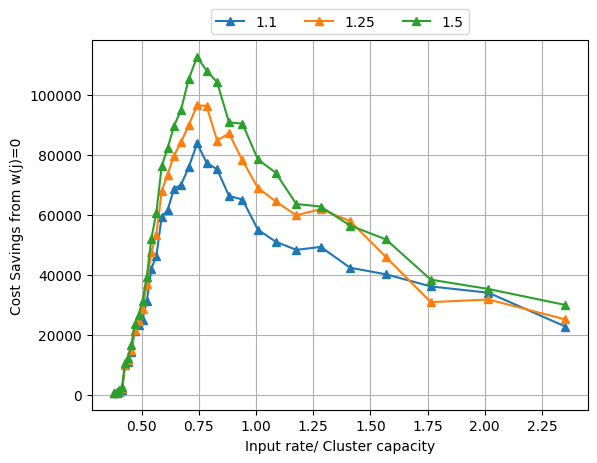

     alg  size         cost_x  waiting_time_x  deadline_x         cost_y  \
0   fifo    24  804771.733889             0.0         1.0  782101.971389   
1   fifo    24  804771.733889             0.0         1.0  779730.947778   
2   fifo    24  804771.733889             0.0         1.0  774923.367500   
3   fifo    28  754886.929167             0.0         1.0  720950.644444   
4   fifo    28  754886.929167             0.0         1.0  723204.965556   
..   ...   ...            ...             ...         ...            ...   
91  fifo   144    5824.407222             0.0         1.0    5055.483889   
92  fifo   144    5824.407222             0.0         1.0    4997.165556   
93  fifo   148    5603.975556             0.0         1.0    5064.770278   
94  fifo   148    5603.975556             0.0         1.0    5003.002500   
95  fifo   148    5603.975556             0.0         1.0    4987.030278   

    waiting_time_y  deadline_y  
0         0.342802        1.10  
1         0.814539   

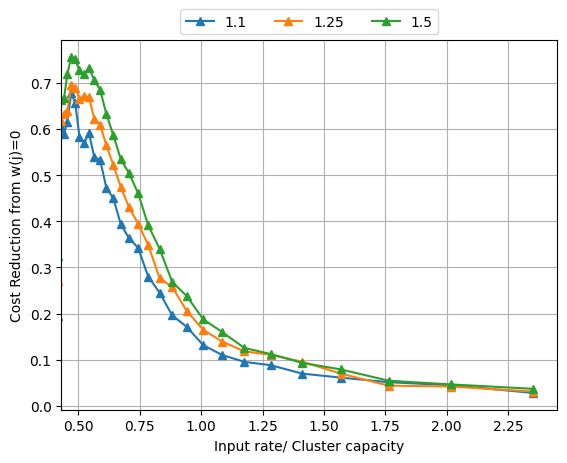

In [78]:
def plot_cost_mult_deadline(results_df, alg='ljf', normalized=False, title=None):
    fig, ax = plt.subplots()
    results_df = results_df[results_df['alg'] == alg]
    one_df = results_df[results_df['deadline'] == 1] 
    results_df = results_df[results_df['deadline'] != 1] 
    results_df = results_df[results_df['deadline'] != 100000] 
    results_df = results_df[results_df['deadline'] <= 1.5] 
    diff_df = pd.merge(one_df,
               results_df, left_on=['alg', 'size'],right_on=['alg', 'size'])
    if normalized:
        print(diff_df)
        diff_df['cost_diff'] = (diff_df['cost_x'] - diff_df['cost_y'])/diff_df['cost_x']
        title = 'Cost Reduction from w(j)=0'
        total_job_gpu_hours = 1155998.77277777
        job_makespan = 2559.3205555555555
        diff_df['x_axis'] = total_job_gpu_hours/(job_makespan*diff_df['size']*8)
        label_x = 'Input rate/ Cluster capacity'
    else:
        diff_df['cost_diff'] = diff_df['cost_x'] - diff_df['cost_y']
        title = 'Cost Savings from w(j)=0'
        total_job_gpu_hours = 1155998.77277777
        job_makespan = 2559.3205555555555
        diff_df['x_axis'] = total_job_gpu_hours/(job_makespan*diff_df['size']*8)
        label_x = 'Input rate/ Cluster capacity'
        #diff_df['x_axis'] = diff_df['size']
        #label_x = '# of Cluster Node(s)'

    for idx, (label, grp) in enumerate(diff_df.groupby('deadline_y')):
        a1 = grp.plot(x = 'x_axis', y = 'cost_diff',ax = ax, marker='^', label = label, legend=None, xlabel=label_x, \
                ylabel=title)
    #ax.set_ylim(bottom=1.0)
    if normalized:
        ax.set_xlim(left=0.43)
    else:
        pass
        #ax.set_xlim(left=0.43)
        #ax.set_xlim(right=108.0)
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, ncol=len(labels), \
              bbox_to_anchor=(0, 0.95, 1, 0.2), loc="center")
    ax.grid(True, which='both')
    plt.show()

plot_cost_mult_deadline(hybrid_results_df, alg='fifo')
plot_cost_mult_deadline(hybrid_results_df, alg='fifo', normalized=True)

1.25
['lvjf', 'lvjf-backfill', 'swf', 'swf-best', 'fifo', 'fifo-backfill', 'fifo-backfill-best', 'swf-backfill', 'swf-backfill-best']


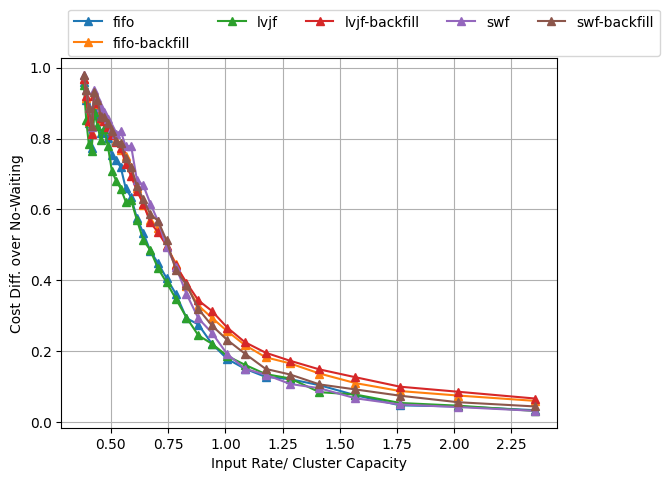

In [17]:
def plot_normalized_cost_deadline(results_df, deadline=1.25, title=None):
    fig, ax = plt.subplots()
    options = []
    options = ['lvjf', 'lvjf-backfill', 'swf', 'swf-best', 'fifo', 'fifo-backfill', 'fifo-backfill-best', 'swf-backfill', 'swf-backfill-best']#, 'lvjf'] #, 'sjf', 'lvjf', 'svjf']#, 'lifo', 'swf'] #'lvjf', 'svjf', 'sjf']
    #options = options + [o + '-backfill' for o in options]
    #options = options + [o + '-best' for o in options]
    #options = options + [o + '-backfill-best' for o in options]
    #options.append('fifo')
    #options.remove('svjf')
    #options.remove('swf')
    #options = [o for o in options if 'backfill' in o]
    print(options)
    #options.remove('fifo-backfill')
    results_df = results_df[results_df['alg'].isin(options)]
    baseline_df = results_df[results_df['deadline']==1]
    baseline_df =  baseline_df[ baseline_df['alg']=='fifo']
    del baseline_df['alg']
    
    results_df = results_df[results_df['deadline']==deadline]
    
    diff_df = pd.merge(baseline_df,
               results_df, left_on=['size'],right_on=['size'])
    total_job_gpu_hours = 1155998.77277777
    job_makespan = 2559.3205555555555
    diff_df['cost_diff'] = (diff_df['cost_x'] - diff_df['cost_y'])/diff_df['cost_x']
    diff_df['x_axis'] = total_job_gpu_hours/(job_makespan*diff_df['size']*8)

    for idx, (label, grp) in enumerate(diff_df.groupby('alg')):
        a1 = grp.plot(x = 'x_axis', y = 'cost_diff',ax = ax, marker='^', label = label, legend=None, xlabel='Input Rate/ Cluster Capacity', \
                ylabel='Cost Diff. over No-Waiting')
    lines, labels = ax.get_legend_handles_labels()
    #plt.xlim(left=0.46)
    #plt.ylim(bottom=-0.25, top = 0.6)
    ax.legend(lines, labels, ncol=5, \
              bbox_to_anchor=(0, 0.95, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()

for ddl in [1.25]:
    print(ddl)
    plot_normalized_cost_deadline(hybrid_results_df, deadline=ddl)

swf
    alg_x  size         cost_x  waiting_time_x  deadline_x       alg_y  \
0    fifo    24  804771.733889             0.0         1.0        fifo   
1    fifo    24  804771.733889             0.0         1.0        lifo   
2    fifo    24  804771.733889             0.0         1.0         sjf   
3    fifo    24  804771.733889             0.0         1.0        svjf   
4    fifo    24  804771.733889             0.0         1.0         ljf   
..    ...   ...            ...             ...         ...         ...   
635  fifo   148    5603.975556             0.0         1.0  lvjf-nohol   
636  fifo   148    5603.975556             0.0         1.0   edf-nohol   
637  fifo   148    5603.975556             0.0         1.0   ldf-nohol   
638  fifo   148    5603.975556             0.0         1.0   swf-nohol   
639  fifo   148    5603.975556             0.0         1.0   lwf-nohol   

            cost_y  waiting_time_y  deadline_y  
0    779730.947778        0.814539        1.25  
1    7847

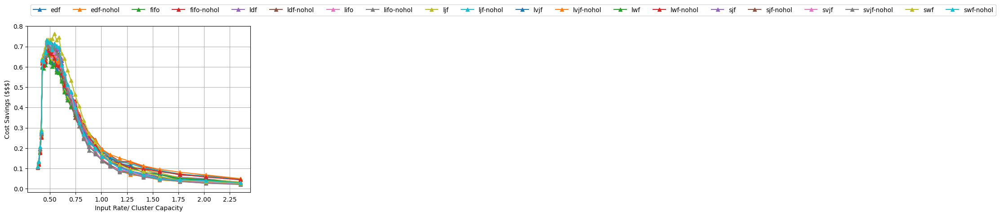

In [93]:
def plot_normalized_cost_deadline(results_df, alg='ljf', title=None):
    fig, ax = plt.subplots()
    #options = ['fifo', 'sjf', 'ljf', 'srwf']
    #results_df = results_df[results_df['alg'].isin(options)]
    one_df = results_df[results_df['deadline'] == 1] 
    one_df = one_df[one_df['alg'] == 'fifo']
#     results_df = results_df[results_df['deadline'] != 1] 
#     results_df = results_df[results_df['deadline'] != 100000] 
    results_df = results_df[results_df['deadline'] == 1.25] 
    diff_df = pd.merge(one_df,
               results_df, left_on=['size'],right_on=['size'])
    print(diff_df)
    total_job_gpu_hours = 1155998.77277777
    job_makespan = 2559.3205555555555
    diff_df['cost_diff'] = (diff_df['cost_x'] - diff_df['cost_y'])/diff_df['cost_x']
    diff_df['x_axis'] = total_job_gpu_hours/(job_makespan*diff_df['size']*8)

    for idx, (label, grp) in enumerate(diff_df.groupby(['alg_y'])):
        a1 = grp.plot(x = 'x_axis', y = 'cost_diff',ax = ax, marker='^', label = label, legend=None, xlabel='Input Rate/ Cluster Capacity', \
                ylabel='Cost Savings ($$$)')
    #ax.set_ylim(bottom=1.0)
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, ncol=len(labels), \
              bbox_to_anchor=(0, 0.95, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()

for alg in ['swf']:
    print(alg)
    plot_normalized_cost_deadline(hybrid_results_df, alg=alg)

In [1]:
def align_yaxis(ax1, v1, ax2, v2):
    """adjust ax2 ylimit so that v2 in ax2 is aligned to v1 in ax1"""
    _, y1 = ax1.transData.transform((0, v1))
    _, y2 = ax2.transData.transform((0, v2))
    inv = ax2.transData.inverted()
    _, dy = inv.transform((0, 0)) - inv.transform((0, y1-y2))
    miny, maxy = ax2.get_ylim()
    ax2.set_ylim(miny+dy, maxy+dy + 1.0)


def plot_input_output_rate_over_time(hybrid_results, alg, deadline=1.25, num_nodes=100, window_size=1, stride=None):
    if not stride:
        stride = window_size
    
    no_wait_jobs = hybrid_results[1][f'fifo-{num_nodes}']
    wait_jobs = hybrid_results[deadline][f'{alg}-{num_nodes}']
    
    total_jobs = len(wait_jobs['idx'])
    
    active_jobs = []
    cost_no_wait_jobs = {}
    cost_wait_jobs = {}
    
    counter_job_idx = 0
    hour_counter =0
    while counter_job_idx < total_jobs:
        old_counter_job_idx = counter_job_idx
        while counter_job_idx < total_jobs:
            if wait_jobs['arrival'][counter_job_idx] < hour_counter + 1:
                counter_job_idx+=1
            else:
                break
                
        if hour_counter not in cost_wait_jobs:
            cost_wait_jobs[hour_counter] = 0
        
        if hour_counter not in cost_no_wait_jobs:
                cost_no_wait_jobs[hour_counter] = 0

        for j_idx in range(old_counter_job_idx, counter_job_idx):
            if wait_jobs['start'][j_idx] ==-1 and j_idx!=0:
                cost_wait_jobs[hour_counter] += wait_jobs['num_gpus'][j_idx]*wait_jobs['runtime'][j_idx]
            
            if no_wait_jobs['start'][j_idx] == -1 and j_idx!=0:
                cost_no_wait_jobs[hour_counter] += no_wait_jobs['num_gpus'][j_idx]*no_wait_jobs['runtime'][j_idx]
        hour_counter += 1
    
    import math
    input_over_capacity_dict = {}
    for j_idx in range(total_jobs):
        num_gpus = wait_jobs['num_gpus'][j_idx]
        arrival = wait_jobs['arrival'][j_idx]
        runtime = wait_jobs['runtime'][j_idx]
        end = arrival + runtime
        for hour in range(math.floor(arrival), math.ceil(end)):
            low = arrival if arrival > hour else hour
            high = end if end < hour+1 else hour+1

            if hour not in input_over_capacity_dict:
                input_over_capacity_dict[hour] = 0
            input_over_capacity_dict[hour]+= (high-low)*num_gpus

    cloud_cost = 0
    for key in input_over_capacity_dict.keys():
         cloud_cost += max(0,  input_over_capacity_dict[key] - num_nodes * 8)
            
    print(f'Lower bound of optimal for no wait: {cloud_cost}')
    
    cloud_cost = 0
    for j_idx in range(total_jobs):
        if no_wait_jobs['start'][j_idx]==-1 and j_idx!=0:
            cloud_cost += no_wait_jobs['num_gpus'][j_idx]*no_wait_jobs['runtime'][j_idx]
    print(f'No wait simulator cost: {cloud_cost}')
    
    cloud_cost = 0
    for j_idx in range(total_jobs):
        if wait_jobs['start'][j_idx]==-1 and j_idx!=0:
            cloud_cost += wait_jobs['num_gpus'][j_idx]*wait_jobs['runtime'][j_idx]
    print(f'Wait simulator cost: {cloud_cost}')

    window_diff = []
    x_axis = []
    final_input_output = []
    window_idx = 0
    while window_idx < hour_counter:
        x_axis.append(window_idx)
        diff = []
        no_wait_cost = []
        wait_cost  = []
        input_output = []
        for idx in range(window_idx, min(window_idx + window_size,hour_counter)):
            diff.append(cost_no_wait_jobs[idx] - cost_wait_jobs[idx])
            no_wait_cost.append(cost_no_wait_jobs[idx])
            wait_cost.append(cost_wait_jobs[idx])
        window_diff.append(sum(diff))
        for i in range(window_idx, window_idx + stride):
            if i not in input_over_capacity_dict:
                input_output.append(0)
            else:
                input_output.append(input_over_capacity_dict[i])
        final_input_output.append(sum(input_output)/(len(input_output)*num_nodes * 8))
        window_idx += stride
        
    # Calculating total volume
    default_figsize = plt.rcParams.get('figure.figsize')
    fig, ax = plt.subplots(figsize=(3*default_figsize[0], 1*default_figsize[1]))
    ax2 = ax.twinx()
    ax.bar(x_axis, window_diff, width=window_size, edgecolor='black')
    ax2.plot(x_axis, final_input_output, color='red')
    ax.axhline(y = 0.0, color = 'black', linestyle = '-')
    ax2.axhline(y = 1.0, color = 'green', linestyle = '--')
    ax.set_xlabel('Hours into Simulation')
    ax.set_ylabel(f'Cost Mult for {alg}-{deadline} over w(j)=0')
    ax2.set_ylabel('Input volume/Cluster capacity')
    align_yaxis(ax, 0, ax2, 0)
    plt.show()

    
from skyburst.simulator import run_simulator

plot_input_output_rate_over_time(hybrid_results, 'fifo', window_size=24, num_nodes=72)
#plot_input_output_rate_over_time(hybrid_results, 'swf', window_size=24, num_nodes=72)

NameError: name 'hybrid_results' is not defined

In [5]:
def plot_job_statistics(jobs, bins=None):
    jobs = copy.deepcopy(jobs)
    runtime = [j.runtime for j in jobs]
    if bins is None:
        bins = [0, 0.1, 1, 8, 24, 168, math.ceil(max(runtime))]
    
    counts = [0] * (len(bins)-1)
    costs = [0] * (len(bins)-1)
    runtime = [j.runtime for j in jobs]
    for job_idx, r in enumerate(runtime):
        for bin_idx in range(len(bins)-1):
            if r >= bins[bin_idx] and r < bins[bin_idx+1]:
                counts[bin_idx] +=1
                costs[bin_idx] += jobs[job_idx].cost

    fig, ax = plt.subplots()
    for idx, c in enumerate(counts):
        pps = ax.bar(f'[{bins[idx]},{bins[idx+1]})', height=c, edgecolor='black', align='center', label=f'[{bins[idx]},{bins[idx+1]})')
        for p in pps:
            height = p.get_height()
            ax.annotate('{}'.format(height),
              xy=(p.get_x() + p.get_width() / 2, height),
              xytext=(0, 2), # 3 points vertical offset
              textcoords="offset points",
              ha='center', va='bottom')
    plt.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    plt.xlabel('Job Runtimes (hr)')
    plt.ylabel('Count')
    plt.title('Job Runtime PDF')
    plt.show()
    
    
    fig, ax = plt.subplots()
    for idx, c in enumerate(costs):
        pps = ax.bar(f'[{bins[idx]},{bins[idx+1]})', height=c, edgecolor='black', align='center', label=f'[{bins[idx]},{bins[idx+1]})')
    plt.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    plt.xlabel('Job Runtimes (hr)')
    plt.ylabel('Cost')
    plt.title('Total Costs PDF')
    plt.show()
    

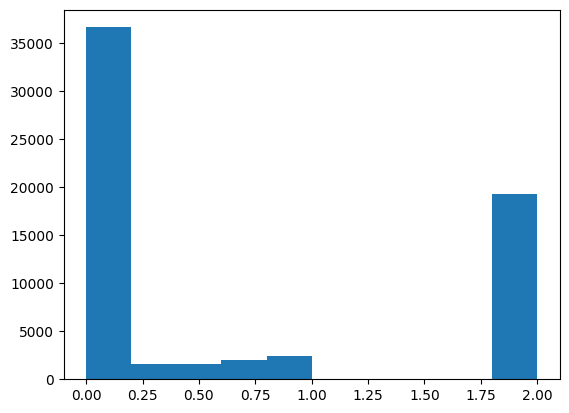

In [12]:
plot_job_waiting_time_distribution(hybrid_results[2]['fifo-88'], deadline=2, job_filter=lambda x: x.runtime <= 1.0)

In [6]:
plot_job_statistics(hybrid_results[1.25]['fifo-88'])

AttributeError: 'str' object has no attribute 'runtime'

In [47]:
def plot_run_statistics(jobs):
    jobs = copy.deepcopy(jobs)
    runtime = [j.runtime for j in jobs]
    bins = [0, 0.1, 1, 8, 24, 168, math.ceil(max(runtime))]
    
    # Plot total waiting hours as a function of jobs runtimes
    waiting_onprem = [0] * (len(bins)-1)
    waiting_cloud = [0] * (len(bins)-1)
    costs = [0] * (len(bins)-1)
    runtime = [j.runtime for j in jobs]
    for job_idx, r in enumerate(runtime):
        for bin_idx in range(len(bins)-1):
            if r >= bins[bin_idx] and r < bins[bin_idx+1]:
                if jobs[job_idx].start is None:
                    waiting_cloud[bin_idx] += jobs[job_idx].deadline - jobs[job_idx].runtime - jobs[job_idx].arrival
                    costs[bin_idx] += jobs[job_idx].cost
                else:
                    waiting_onprem[bin_idx] += jobs[job_idx].start - jobs[job_idx].arrival

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12.8, 4.8))
    ax = axes[0]
    for idx, c in enumerate(waiting_onprem):
        pps = ax.bar(f'[{bins[idx]},{bins[idx+1]})', height=c, \
                     edgecolor='black', align='center', color='#1f77b4', label=f'Local')
        pps = ax.bar(f'[{bins[idx]},{bins[idx+1]})', height=waiting_cloud[idx], bottom=c, \
                     edgecolor='black', align='center', color='#ff7f0e', label=f'Cloud')
    ax.legend(['Local', 'Cloud'])
    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    ax.set_xlabel('Job Runtimes (hr)')
    ax.set_ylabel('Cumulative Waiting Hours')
    ax.set_title('Total Waiting')

    ax = axes[1]
    for idx, c in enumerate(costs):
        pps = ax.bar(f'[{bins[idx]},{bins[idx+1]})', height=c, \
                     edgecolor='black', align='center', color='#1f77b4', label=f'Local')
    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    ax.set_xlabel('Job Runtimes (hr)')
    ax.set_ylabel('Cumulative Costs')
    ax.set_title('Total Costs')
    plt.show()

    
def plot_job_waiting_time_distribution(jobs, deadline, job_filter = None, include_cloud=True):
    jobs = copy.deepcopy(jobs)
    
    if not include_cloud:
        jobs = [j for j in jobs if j.start is not None]
    
    if job_filter:
        jobs = [j for j in jobs if job_filter(j)]
    
    waiting_time_percent = []
    for j in jobs:
        if j.start is None:
            waiting_time_percent.append(deadline)
        elif j.runtime == 0:
            waiting_time_percent.append(1)
        else:
            waiting_time_percent.append((j.start - j.arrival)/j.runtime)
    #print(waiting_time_percent)
    plt.hist(waiting_time_percent)
    plt.show()

fifo-72


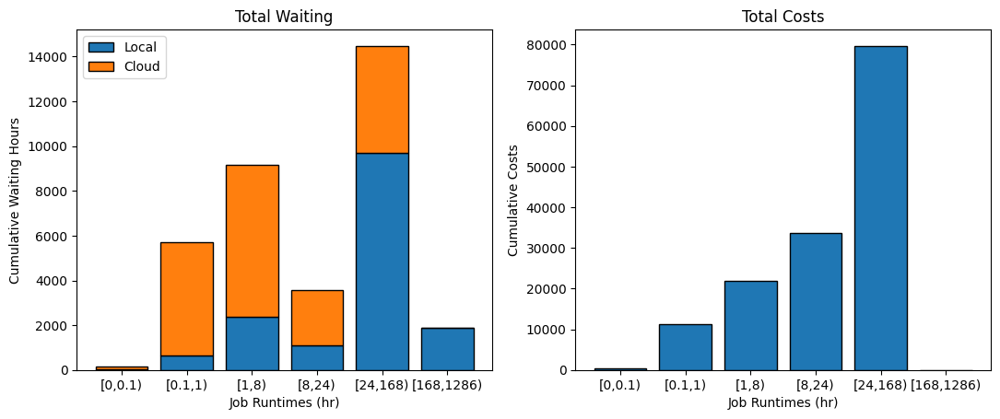

sjf-72


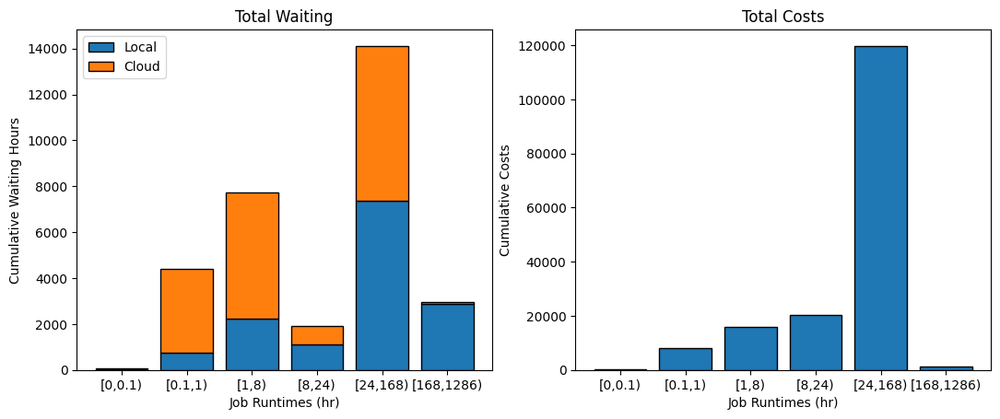

ljf-72


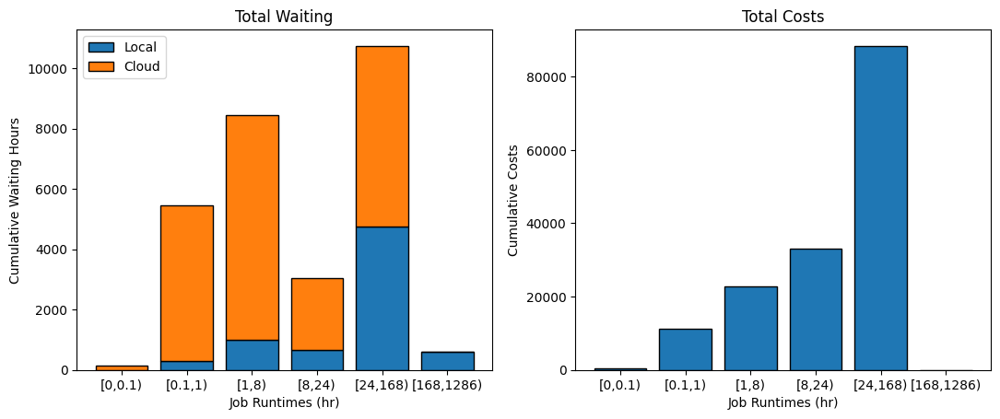

In [50]:
algs = ['fifo', 'sjf', 'ljf']
for alg in algs:
    run_str = f'{alg}-72'
    print(run_str)
    plot_run_statistics(hybrid_results[1.5][run_str])

0


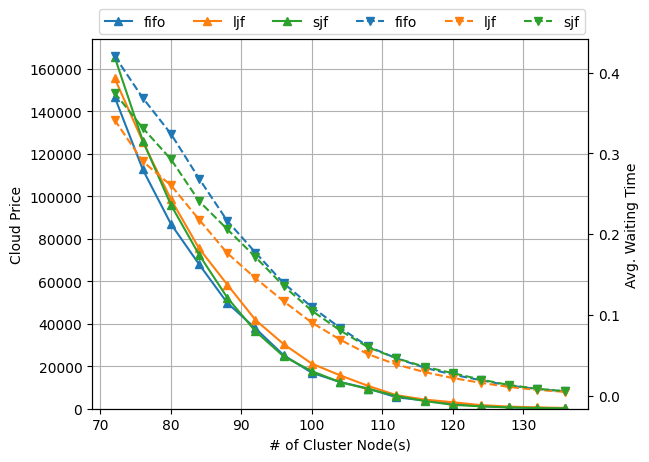

1


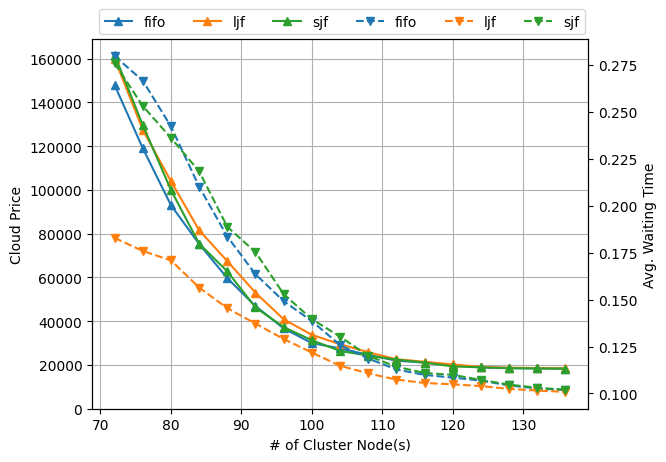

2


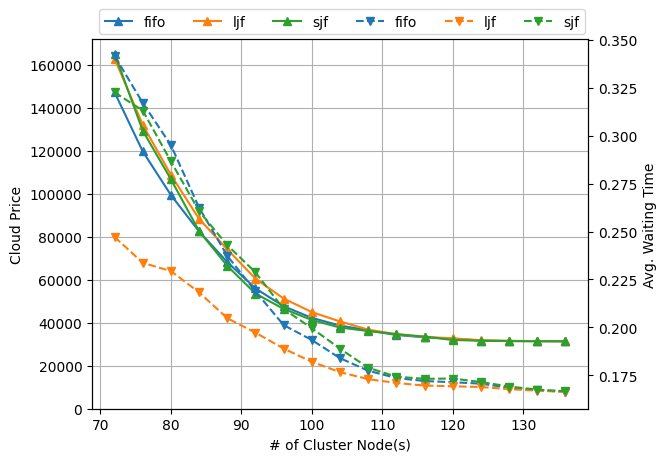

4


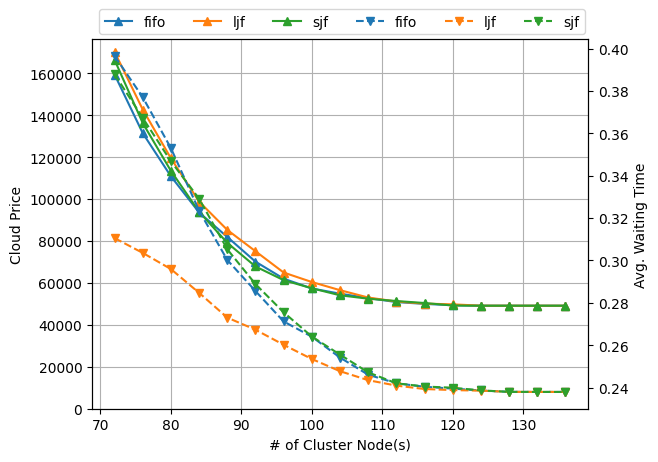

8


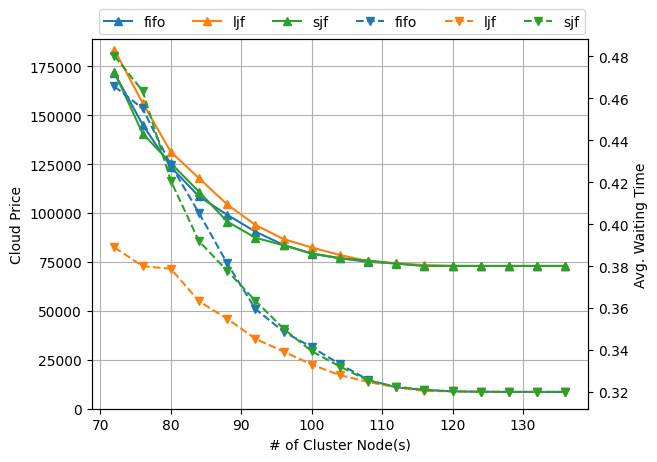

KeyError: 0

In [54]:
def create_thres_results_df(simulator_results: dict):
    results_df = pd.DataFrame({'alg': pd.Series(dtype='str'),
                   'size': pd.Series(dtype='int'),
                   'cost': pd.Series(dtype='float'),
                   'waiting_time': pd.Series(dtype='float')})
    for key, finished_jobs in simulator_results.items():
        alg, num_nodes = key.split('-')
        num_nodes = int(num_nodes)
        cloud_cost = 0.0
        total_waiting_time = 0.0
        for j in finished_jobs:
            if j.start is None:
                cloud_cost += j.cost
                if hasattr(j, 'state') and j.state == 'TIMEOUT-CLOUD':
                    pass
                else:
                    total_waiting_time += j.deadline - j.runtime - j.arrival
            else:
                total_waiting_time += j.start - j.arrival
        avg_waiting_time = total_waiting_time / len(finished_jobs)
        df = pd.DataFrame(data={'alg': [alg], 'size': [num_nodes], 'cost': [cloud_cost], 'waiting_time': [avg_waiting_time]})
        results_df = pd.concat([results_df, df], ignore_index=True)
    results_df['deadline'] = 1.5
    return results_df

def plot_waiting_cost_thres_graph(results_df, thres=0, title=None):
    fig, ax = plt.subplots()
    ax2 = ax.twinx()
    
    for idx, (label, grp) in enumerate(results_df.groupby('alg')):
        a1 = grp.plot(x = 'size', y = 'cost',ax = ax, marker='^', label = label, legend=None, xlabel='# of Cluster Node(s)', \
                ylabel='Cloud Price')
        a2 = grp.plot(x = 'size', y = 'waiting_time', ax = ax2, marker='v', label = label, legend=None, ylabel = 'Avg. Waiting Time', style='--')
    ax.set_ylim(bottom=0.0)
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines + lines2, labels + labels2, ncol=len(labels) + len(labels2), \
              bbox_to_anchor=(0, 0.90, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()  

hybrid_thres_results = {}
hybrid_thres_results_df = None
for thres in [0, 1, 2, 4, 8]:
    print(thres)
    file = open(f'logs/vjw_philly_1.5_{thres}_cont.log', 'rb')
    hybrid_thres_results[thres] = pickle.load(file)
    hybrid_thres_results_df = create_thres_results_df(hybrid_thres_results[thres])
    plot_waiting_cost_thres_graph(hybrid_thres_results_df)

    

In [55]:
hybrid_thres_results_df = pd.DataFrame()
for thres in [0, 1, 2, 4, 8]:
    temp_df = create_results_df(hybrid_thres_results[thres])
    temp_df['thres'] = thres
    hybrid_thres_results_df  = pd.concat([hybrid_thres_results_df , temp_df], ignore_index=True)

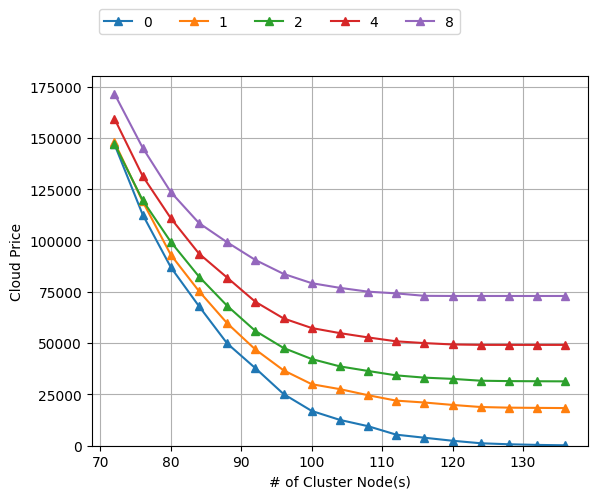

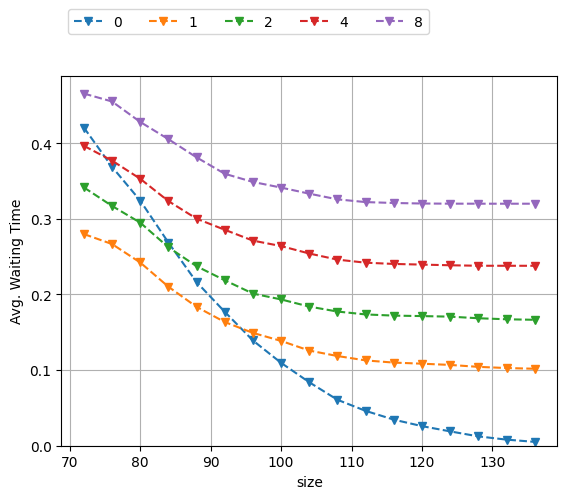

In [64]:
def plot_waiting_cost_graph_diff_thres_deadline(results_df, alg='fifo', title=None):
    fig, ax = plt.subplots()
    results_df = results_df[results_df['alg'] == alg]

    for idx, (label, grp) in enumerate(results_df.groupby('thres')):
        a1 = grp.plot(x = 'size', y = 'cost',ax = ax, marker='^', label = label, legend=None, xlabel='# of Cluster Node(s)', \
                ylabel='Cloud Price')
    ax.set_ylim(bottom=0.0)
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, ncol=len(labels), \
              bbox_to_anchor=(0, 1.0, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()
    
    fig, ax = plt.subplots()
    results_df = results_df[results_df['alg'] == alg] 
    for idx, (label, grp) in enumerate(results_df.groupby('thres')):
        a2 = grp.plot(x = 'size', y = 'waiting_time', ax = ax, marker='v', label = label, legend=None, ylabel = 'Avg. Waiting Time', style='--')
    ax.set_ylim(bottom=0.0)
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, ncol=len(labels), \
              bbox_to_anchor=(0, 1.0, 1, 0.2), loc="upper left")
    ax.grid(True, which='both')
    plt.show()

plot_waiting_cost_graph_diff_thres_deadline(hybrid_thres_results_df)

fifo-72


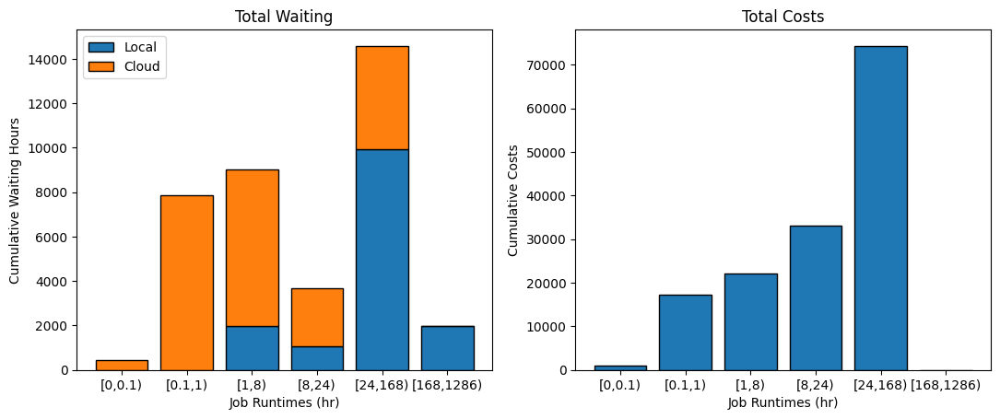

sjf-72


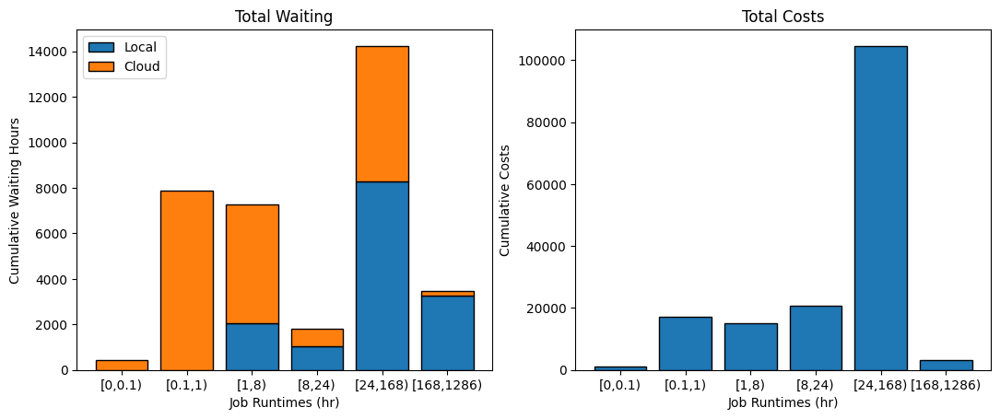

ljf-72


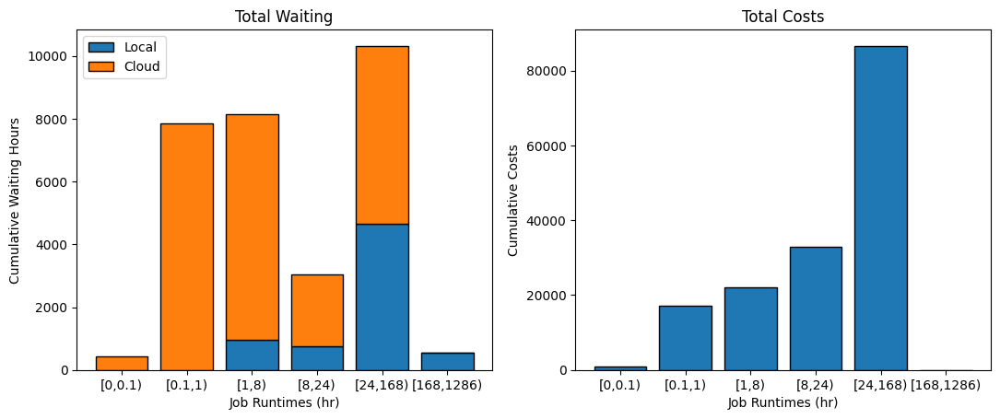

In [59]:
algs = ['fifo', 'sjf', 'ljf']
for alg in algs:
    run_str = f'{alg}-72'
    print(run_str)
    plot_run_statistics(hybrid_thres_results[1][run_str])

In [25]:

def plot_trace_spacetime(jobs, num_nodes):
    jobs = jobs.copy()
    NUM_COLORS = len(jobs)+5
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    jobs.sort(key=lambda x: x.idx)
    fig, ax = plt.subplots(figsize=(100,50))
    total_gpus = num_nodes * GPUS_PER_NODE
    for j_idx, job in enumerate(jobs):
        allocated_gpus = job.allocated_gpus
        if not allocated_gpus:
            continue
        for node_idx in allocated_gpus.keys():
            for node_gpu_idx in allocated_gpus[node_idx]:
                gpu_idx = total_gpus - (GPUS_PER_NODE * node_idx + node_gpu_idx)
#                 print(job.idx)
#                 print(len(colors))
                ax.barh(gpu_idx,
                        width=job.runtime,
                        edgecolor='black',
                        height=1.0,
                        left=job.start,
                        align='edge',
                        color=colors[job.idx])
    import math
    for i in range(total_gpus+1):
        multiplier = math.ceil(num_nodes/32)
        if (i+1)%GPUS_PER_NODE==1:
            plt.axhline(y=i+1,linewidth=8/multiplier, color='brown')
        else:
            plt.axhline(y=i+1,linewidth=1/multiplier, color='black', linestyle='--')
    plt.ylim(bottom=1, top=total_gpus+1)
    plt.xlim(right=1.5*max([j.arrival for j in jobs]))
    plt.axvline(x=max([j.arrival for j in jobs]), color='black', linewidth=5)
    plt.tight_layout()
    plt.show()
    
def visualize_jobs(jobs, mode='all'):
    jobs = jobs.copy()
    NUM_COLORS = len(jobs)
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    jobs.sort(key=lambda x: x.idx)
    x = [(j.arrival, j.deadline) for j in jobs]
    fig, ax = plt.subplots(figsize=(100,50))
    
    count=0
    for i,evt in enumerate(x):
        if mode=='all':
            mask = 1
        elif mode=='cloud':
            if jobs[i].start is None:
                mask=1
            else:
                mask=0
        elif mode=='local':
            if jobs[i].start is None:
                mask=0
            else:
                mask=1
#         ax.barh(count,
#                 width=(evt[1]-evt[0]),
#                 edgecolor='black' if mask else None,
#                 height=1.0*jobs[i].num_gpus,
#                 left=evt[0],
#                 align='edge',
#                 color=colors[i] if mask else 'grey')
        ax.barh(count,
                width=mask*(evt[1]-evt[0]),
                edgecolor='black' if mask else None,
                height=1.0*jobs[i].num_gpus,
                left=evt[0],
                align='edge',
                color=colors[i] if mask else None)

        count+= jobs[i].num_gpus 
    ax.get_yaxis().set_visible(False)
    plt.xlabel('Time Quantums')
    plt.show()

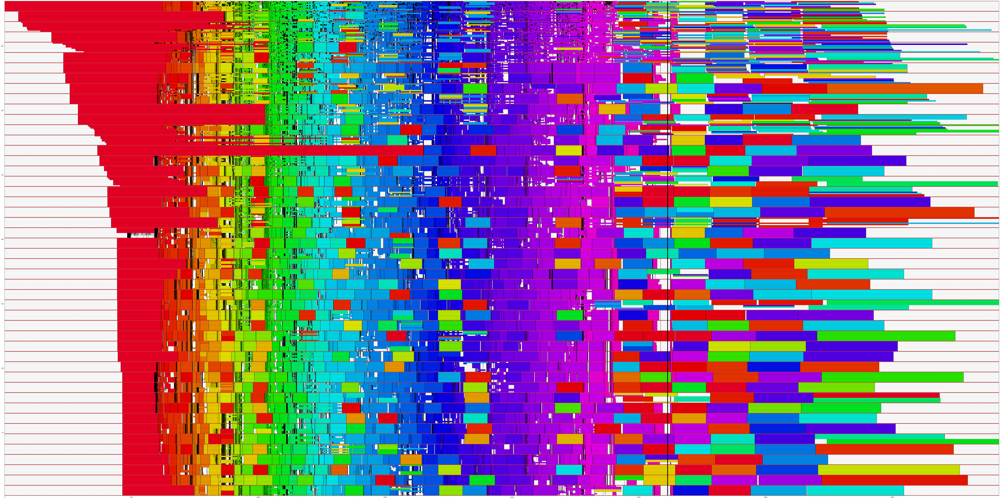

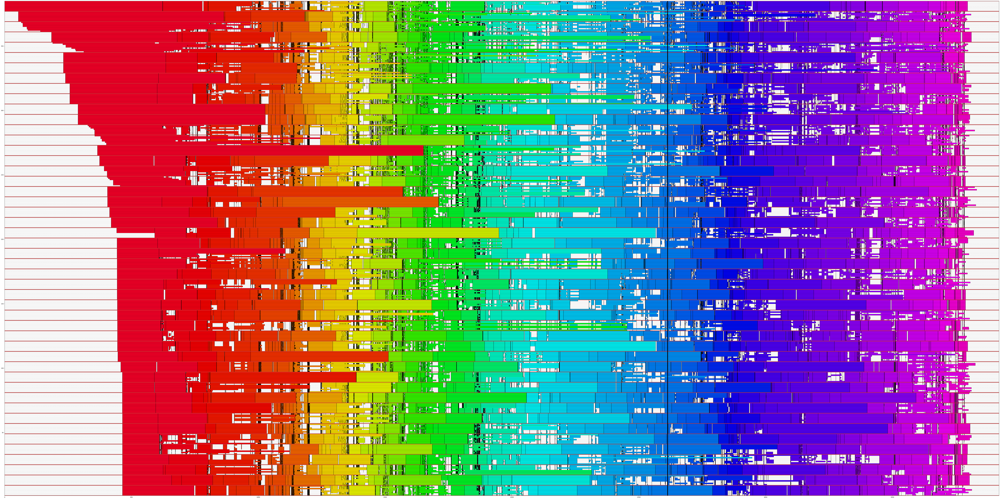

In [47]:
plot_trace_spacetime(hybrid_results[100000]['sjf-48'], 48)
plot_trace_spacetime(hybrid_results[100000]['fifo-48'], 48)

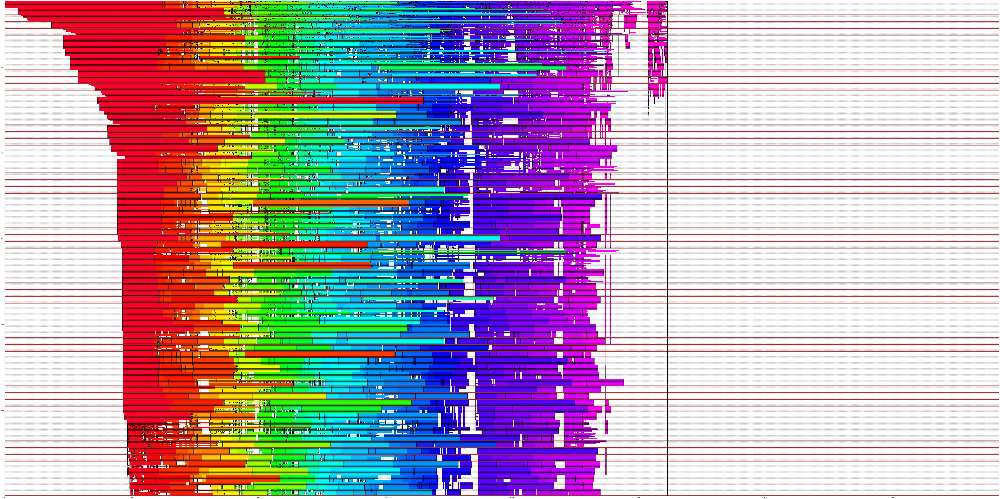

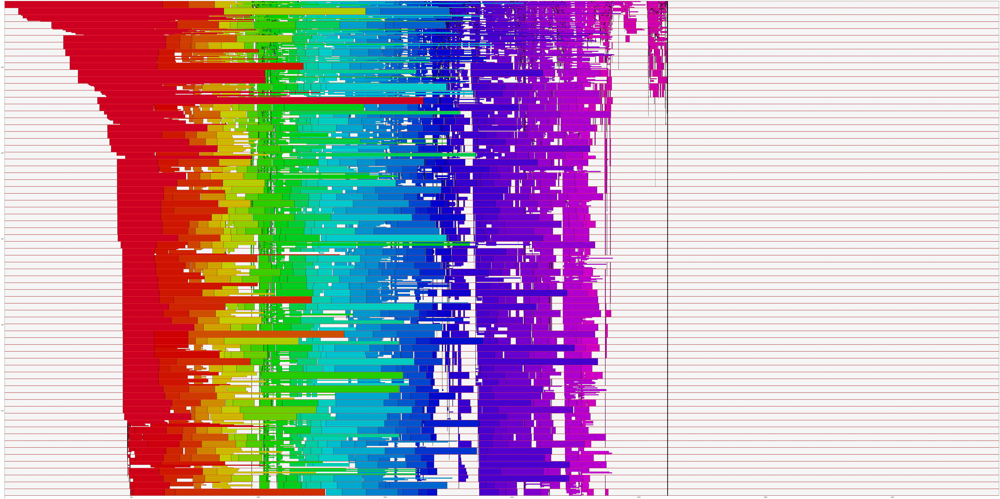

In [16]:
plot_trace_spacetime(hybrid_results[1.5]['srwf-72'], 72)
plot_trace_spacetime(hybrid_results[1.5]['fifo-72'], 72)

In [5]:
hybrid_results.keys()

dict_keys([1, 1.25])

In [38]:
lmao = hybrid_results[100000]['svjf-100']
wait_dict = {}
for idx in range(len(lmao['idx'])):
    if idx==0:
        continue
    if lmao['num_gpus'][idx] not in wait_dict:
        wait_dict[lmao['num_gpus'][idx]] = []
    
    if lmao['start'][idx] == -1:
        pass
#         print(idx)
#         raise ValueError('wtf')
    if lmao['start'][idx] - lmao['arrival'][idx] >0:
        wait_dict[lmao['num_gpus'][idx]].append(lmao['start'][idx] - lmao['arrival'][idx])

In [39]:
keys = list(wait_dict.keys())
keys.sort()
for k in keys:
    print(f'{k} nodes: Avg waiting time: {np.mean(np.array(wait_dict[k]))}')

0 nodes: Avg waiting time: nan
1 nodes: Avg waiting time: 1.1417367214181973
2 nodes: Avg waiting time: 8.47519930947894
4 nodes: Avg waiting time: 3.409503736192337
8 nodes: Avg waiting time: 6.309257683215129
12 nodes: Avg waiting time: 2.274111111111142
16 nodes: Avg waiting time: 8.732964975845418
24 nodes: Avg waiting time: 1.8759259259259882
32 nodes: Avg waiting time: 13.553511111111106
64 nodes: Avg waiting time: nan
128 nodes: Avg waiting time: nan


In [28]:
accum_wait_time = []
areas = []
for idx in range(len(lmao['idx'])):
    accum_wait_time.append(max(1/12.0, 0.25* lmao['runtime'][idx]))
    areas.append(lmao['runtime'][idx] * lmao['num_gpus'][idx])
print(sum(accum_wait_time)/len(lmao['idx']))
print(sum(accum_wait_time)/sum(areas))

1.045615182205313
0.07521382107713956


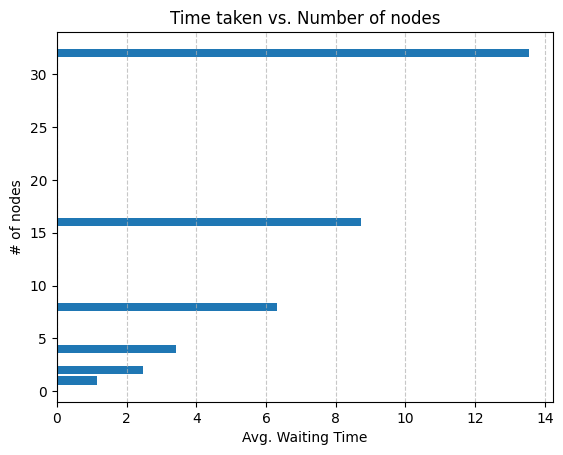

In [40]:
import matplotlib.pyplot as plt

# Data
nodes = [1, 2, 4, 8, 16, 32]
time_taken = [1.1417367214181973, 2.47519930947894, 3.409503736192337, 6.309257683215129, 8.732964975845418, 13.553511111111106]

# Create the horizontal bar plot
plt.barh(nodes, time_taken)

# Set axis labels
plt.xlabel('Avg. Waiting Time')
plt.ylabel('# of nodes')

# Customize the plot appearance
plt.title('Time taken vs. Number of nodes')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.show()
